# Imports

In [1]:
%reload_ext autoreload
%autoreload 2
import matplotlib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from statannotations.Annotator import Annotator

%run ../../setup_project.py
%run ../../generic_plot_functions.py
%run leverReconstructionFunctions.py

In [2]:
projectName, dataPath, dlcModelPath, myProject, sSessions= setup_project_session_lists(projectName="autopi_mec",dataPath=PROJECT_DATA_PATH,dlcModelPath="")

creating myProject, an autopipy.project object
Project name: autopi_mec
dataPath: /ext_drives/d91/data/projects/jingjie/Peng_et.al_2025_noInt/
dlcModelPath: 
Reading /ext_drives/d91/data/projects/jingjie/Peng_et.al_2025_noInt//sessionList
We have 180 testing sessions in the list
spikeA.Kilosort_session objects are in sSessions


# Data Prep

In [3]:
fn = myProject.dataPath + '/results/allSessionDf_with_leverVector_and_last_cohort.csv'
full_all_sessions = pd.read_csv(fn,index_col=0)

In [4]:
from matplotlib.colors import Normalize

hue_min = full_all_sessions['leverAngle'].min()
hue_max = full_all_sessions['leverAngle'].max()

# Create a FixedNorm with the calculated limits
GLOBALHUENORM = Normalize(vmin=hue_min, vmax=hue_max)
GLOBALFONTSIZE = 11

In [5]:
from matplotlib.colors import LinearSegmentedColormap
colors = ['#FF0080','#3F5EFB','#40E0D0','#FF8C00','#FF0080']
cmap = LinearSegmentedColormap.from_list('custom',colors)

In [6]:
color_map_hue = 'leverAngle'

# Make the figure

In [7]:
def plot_lever_full_gridCoord(ax,df,c ='atLever_dark',predicted = True,double=False,stack= False,x_shift=0, y_shift=0,
                              simple=False, ylabel = '',customTicks=True,title='',omitYticks=False,omitXTicks=False):
    trialDf = df[df.condition == c].copy()
    if double:
        v0,v1 = get_double_lever_v(trialDf,predicted=predicted)
        
        vCoordinates_l = pd.DataFrame(np.array([v0,v1,list(trialDf[color_map_hue])*4]).T,columns = ['v0_l','v1_l',color_map_hue])
    else:
        v0,v1 = get_lever_v(trialDf,predicted=predicted)
        vCoordinates_l = pd.DataFrame(np.array([v0,v1,trialDf[color_map_hue]]).T,columns = ['v0_l','v1_l',color_map_hue])
    if double:
        v0,v1 = get_double_v(trialDf,predicted=predicted)
        vCoordinates = pd.DataFrame(np.array([v0,v1,list(trialDf[color_map_hue])*4]).T,columns = ['v0','v1',color_map_hue])
    else:
        v0,v1 = get_v(trialDf,predicted=predicted)
        vCoordinates = pd.DataFrame(np.array([v0,v1,trialDf[color_map_hue]]).T,columns = ['v0','v1',color_map_hue])
    colorMap = cmap

    x_max = 2 * np.pi + x_shift
    y_max = 2 * np.pi + y_shift
    mask = (vCoordinates.v0 < x_max) & (vCoordinates.v0 >= x_shift) & (vCoordinates.v1 < y_max) & (vCoordinates.v1 >= y_shift)

    # Second mask with a margin of np.pi/2 on each side of the x and y axes
    margin = 0
    x_margin_mask = (vCoordinates.v0 < x_max + margin) & (vCoordinates.v0 >= x_shift - margin)
    y_margin_mask = (vCoordinates.v1 < y_max + margin) & (vCoordinates.v1 >= y_shift - margin)

    # Combine the two masks using logical OR (|) to include points in either mask
    combined_mask = mask | (x_margin_mask & y_margin_mask)
        
    a = sns.kdeplot(data=vCoordinates_l,x = 'v0_l',y = 'v1_l',alpha = 1, fill=True, ax = ax)
    
    if stack:
        a = sns.scatterplot(data=vCoordinates,x = 'v0',y = 'v1',hue = color_map_hue, palette = colorMap, ax = ax,legend=False,s = 1)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    ax.set_xlabel("Grid Coordinate X",fontsize=GLOBALFONTSIZE)
    ax.set_ylabel("Grid Coordinate Y",fontsize=GLOBALFONTSIZE)
    ax.set_aspect('equal')
    if not double:
        ax.set_xticks(ticks=[-np.pi, 0, np.pi])
        ax.set_xticklabels([r'-$\pi$', "0", "$\pi$"],fontsize=GLOBALFONTSIZE)
        ax.set_yticks(ticks=[-np.pi, 0, np.pi])
        ax.set_yticklabels([r'-$\pi$', "0", "$\pi$"],fontsize=GLOBALFONTSIZE)
    else:
        ax.set_xticks(ticks=[-np.pi, 0, 3*np.pi])
        ax.set_xticklabels([r'-$\pi$', "0", "3$\pi$"],fontsize=GLOBALFONTSIZE)
        ax.set_yticks(ticks=[-np.pi, 0, 3*np.pi])
        ax.set_yticklabels([r'-$\pi$', "0", "3$\pi$"],fontsize=GLOBALFONTSIZE)
    if double:
        d = 'LOOPED'
    else:
        d = ''
    if predicted:
        ax.set_title(f'{d} Predicted Grid, {c}',fontsize=GLOBALFONTSIZE)
    else:
        ax.set_title(f'{d} Actual Grid, {c}',fontsize=GLOBALFONTSIZE)
        
    if simple:
        ax.set_xticks(ticks=[0, 2*np.pi])
        ax.set_xticklabels(["0", "2$\pi$"],fontsize=GLOBALFONTSIZE)
        ax.set_yticks(ticks=[0, 2*np.pi])
        ax.set_yticklabels(["0", "2$\pi$"],fontsize=GLOBALFONTSIZE)
        ax.set_xlim(0,2*np.pi)
        ax.set_ylim(0,2*np.pi)
        ax.set_title(title,fontsize=GLOBALFONTSIZE)
        ax.set_xlabel("")
        ax.set_ylabel(ylabel,fontsize=GLOBALFONTSIZE)
        
    if customTicks:
        x_ticks = [x_shift+margin,2*np.pi + x_shift+margin]
        y_ticks = [y_shift+margin,2*np.pi + y_shift+margin]
        
        ax.set_xticks(ticks=x_ticks)
        ax.set_yticks(ticks=y_ticks)
        
        if omitXTicks:
            ax.set_xticks([])
            ax.set_xticklabels([],fontsize=GLOBALFONTSIZE)
        else:
            ax.set_xticklabels(["0","2$\pi$"],fontsize=GLOBALFONTSIZE)
            
        if omitYticks:
            ax.set_yticks([])
            ax.set_yticklabels([],fontsize=GLOBALFONTSIZE)
        else:

            ax.set_yticklabels(["0","2$\pi$"],fontsize=GLOBALFONTSIZE)
        
        ax.set_xlim(x_shift+margin,2*np.pi + x_shift+margin)
        ax.set_ylim(y_shift+margin,2*np.pi + y_shift+margin)


In [8]:
def plot_example_full_gridCoord(ax,df,c ='atLever_dark',predicted = True,double=True,color_map_hue='leverAngle',simple=False, x_shift=0, y_shift=0, 
                                ylabel = '',customTicks=True,title='',omitYticks=False,omitXTicks=False):
    
    trialDf = df[df.condition == c].copy()
    
    if double:
        v0,v1 = get_double_v(trialDf,predicted=predicted)
        vCoordinates = pd.DataFrame(np.array([v0,v1,list(trialDf[color_map_hue])*4]).T,columns = ['v0','v1',color_map_hue])
    else:
        v0,v1 = get_v(trialDf,predicted=predicted)
        vCoordinates = pd.DataFrame(np.array([v0,v1,trialDf[color_map_hue]]).T,columns = ['v0','v1',color_map_hue])

    
    colorMap = cmap
    
    x_max = 2 * np.pi + x_shift
    y_max = 2 * np.pi + y_shift
    
    mask = (vCoordinates.v0 < x_max) & (vCoordinates.v0 >= x_shift) & (vCoordinates.v1 < y_max) & (vCoordinates.v1 >= y_shift)

    # Second mask with a margin of np.pi/2 on each side of the x and y axes
    margin = 0
    x_margin_mask = (vCoordinates.v0 < x_max + margin) & (vCoordinates.v0 >= x_shift - margin)
    y_margin_mask = (vCoordinates.v1 < y_max + margin) & (vCoordinates.v1 >= y_shift - margin)
    

    # Combine the two masks using logical OR (|) to include points in either mask
    combined_mask = mask | (x_margin_mask & y_margin_mask)
    
    a = sns.scatterplot(data=vCoordinates[mask],x = 'v0',y = 'v1',hue = color_map_hue, palette = colorMap,hue_norm=GLOBALHUENORM, ax = ax,legend=False,s = 2,alpha = 1)

    sns.scatterplot(data=vCoordinates[combined_mask],x = 'v0',y = 'v1',hue = color_map_hue, palette = colorMap,hue_norm=GLOBALHUENORM, ax = ax,legend=False,s = 2,alpha = 1)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xlabel("Grid Coordinate X")
    ax.set_ylabel("Grid Coordinate Y")
    
    ax.set_aspect('equal')
    if not double:
        ax.set_xticks(ticks=[-np.pi, 0, np.pi])
        ax.set_xticklabels([r'-$\pi$', "0", "$\pi$"],fontsize=GLOBALFONTSIZE)
        ax.set_yticks(ticks=[-np.pi, 0, np.pi])
        ax.set_yticklabels([r'-$\pi$', "0", "$\pi$"],fontsize=GLOBALFONTSIZE)
    
    else:
        ax.set_xticks(ticks=[-np.pi, 0, 3*np.pi])
        ax.set_xticklabels([r'-$\pi$', "0", "3$\pi$"],fontsize=GLOBALFONTSIZE)
        ax.set_yticks(ticks=[-np.pi, 0, 3*np.pi])
        ax.set_yticklabels([r'-$\pi$', "0", "3$\pi$"],fontsize=GLOBALFONTSIZE)
        
    if double:
        d = 'LOOPED'
    else:
        d = ''
    
    if predicted:
        ax.set_title(f'{d} Predicted Grid, {c}',fontsize=GLOBALFONTSIZE)
    else: 
        ax.set_title(f'{d} Actual Grid, {c}',fontsize=GLOBALFONTSIZE)
        
    if simple:
        ax.set_xticks(ticks=[0, 2*np.pi])
        ax.set_xticklabels(["0", "2$\pi$"],fontsize=GLOBALFONTSIZE)
        ax.set_yticks(ticks=[0, 2*np.pi])
        ax.set_yticklabels(["0", "2$\pi$"],fontsize=GLOBALFONTSIZE)
        ax.set_xlim(0,2*np.pi)
        ax.set_ylim(0,2*np.pi)
        
        # ax.spines['left'].set_visible(False)
        # ax.spines['bottom'].set_visible(False)
        
        ax.set_xlabel("")
        ax.set_ylabel(ylabel,fontsize=GLOBALFONTSIZE)
        ax.set_title(title,fontsize=GLOBALFONTSIZE)
        
    if customTicks:
        x_ticks = [x_shift+margin,2*np.pi + x_shift+margin]
        y_ticks = [y_shift+margin,2*np.pi + y_shift+margin]
        
        ax.set_xticks(ticks=x_ticks)
        ax.set_yticks(ticks=y_ticks)
        
        if omitXTicks:
            ax.set_xticks([])
            ax.set_xticklabels([],fontsize=GLOBALFONTSIZE)
        else:
            ax.set_xticklabels(["0","2$\pi$"],fontsize=GLOBALFONTSIZE)
        
        if omitYticks:
            ax.set_yticks([])
            ax.set_yticklabels([],fontsize=GLOBALFONTSIZE)
        else:
            ax.set_yticklabels(["0","2$\pi$"],fontsize=GLOBALFONTSIZE)
            
        ax.set_xlim(x_shift+margin,2*np.pi + x_shift+margin)
        ax.set_ylim(y_shift+margin,2*np.pi + y_shift+margin)

In [9]:
def plot_leverPath(ax,df,condition = 'atLever_dark',predicted=False,color_map_hue = 'leverAngle',simple=False,title='',ylabel=''):
    
    if predicted:
        b = sns.scatterplot(data = df[df.condition == condition], x = 'ActualCoordpx',y = 'ActualCoordpy', s =4,
                            hue = color_map_hue,palette=cmap,alpha=1,legend=False) #leverCenterActualpX
    else:    
        b = sns.scatterplot(data = df[df.condition == condition], x = 'xPose',y = 'yPose', s =4,
                            hue = color_map_hue,palette=cmap,alpha=1,legend=False) #leverCenterActualX
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xlabel("Room Coordinate X",fontsize=GLOBALFONTSIZE)
    ax.set_ylabel("Room Coordinate X",fontsize=GLOBALFONTSIZE)
    

    
    ax.set_xlim(-50,50)
    ax.set_ylim(-50,50)
    ax.set_aspect('equal')
    
    if predicted:
        ax.set_title(f'Predicted {condition}',fontsize=GLOBALFONTSIZE)
    else:
        ax.set_title(f'Actual {condition}',fontsize=GLOBALFONTSIZE)
        
    if simple == True:
        if condition == 'atLever_light':
            borderCo = '#FC8D03'
        else:
            borderCo = '#5950E9'
                
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.set_xlabel("")
        ax.set_ylabel(ylabel, labelpad = 30,fontsize=GLOBALFONTSIZE)
        ax.set_title('')
        ax.get_xaxis().set_ticks([])
        ax.get_yaxis().set_ticks([])
        
        #Add the border of the arena
        draw_circle(ax)
        draw_circle(ax,r=40,lw=1,ls='dashed') 
        
        ax.set_title(f"{title}",fontsize=GLOBALFONTSIZE)

In [10]:
fn = myProject.dataPath + '/results/cells.csv'
cellDf = pd.read_csv(fn)

In [11]:
gc = cellDf[cellDf.gridCell_AND]

In [12]:
fn = myProject.dataPath + "/results/myMaps.pickle" #, dictionary with key per condition
with open(fn, 'rb') as handle:
    myMaps = pickle.load(handle)

In [13]:
def plotmap(axes, cluId, maps,showYLabel=True):
    mapindex=cellDf[cellDf.cluId==cluId].cluId
    #print(mapindex,mapindex.index)
    im=maps['circ80_1'][mapindex.index][0]
    im=im[:,~np.isnan(im).all(axis=0)]
    im=im[~np.isnan(im).all(axis=1),:]
    axes.imshow(im.T,origin="lower",cmap='viridis',interpolation=None)

    axes.set_xlabel('')
    axes.spines['top'].set_visible(False)
    axes.spines['right'].set_visible(False)
    axes.spines['left'].set_visible(False)
    axes.spines['bottom'].set_visible(False)
    axes.set_xticks([])
    axes.set_yticks([])

# Loop and plot all figures

In [14]:
# Increasing Y, and figure moves down
# Increasing X, and figure moves left
x_y_shift_list = [
    (-1,1.5), 
    (-1,0.5), 
    (0,-2), 
    (-2,0.2),
    (-2,1.6), 
    (0,3), 
    (0,3), 
    (-2,2), 
    (-2,0), 
    (-2,-2), 
    (-2,-2), 
    (0.5,0), 
    (-0.5,1.5), 
    (3,-1.5), 
    (1,-2), 
    (-2,1),  
    (1,0), 
    (0,0), 
    (-3,-2), 
    (1.2,-2), 
    (0,3), 
    (2,2), 
    (-2.5,1), 
    (1,1), 
]

# Create final figure

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

def plot_color_ring(ax): #Need to add this to the axis: subplot_kw={'projection': 'polar'}
    # Define your colors and create a custom colormap
    colors = ['#ff0080', '#3f5efb', '#40e0d0', '#ff8c00', '#ff0080']
    cmap = LinearSegmentedColormap.from_list('custom', colors)

    # Specify angles and radii for the circle ring
    angles = np.linspace(0, 2 * np.pi, 360) # Divide the circle into 360 degrees
    radii = np.ones(360)*2 # Set radii to 1 for a ring

    # Plot the circle ring with the specified colors based on angles
    ax.scatter(angles, radii, c=angles, cmap=cmap, s=50)

    # # Set the direction of the polar plot to clockwise
    ax.set_theta_direction(1) # Clockwise direction
    ax.set_theta_offset(np.pi) # Set 0 degrees to the top

    # # Remove the axis labels and grid
    ax.set_xticks([]) # Remove angle labels
    ax.set_yticks([]) # Remove radius labels

    ax.set_ylim(0, 2)
    ax.grid(False)
    ax.spines['polar'].set_visible(False)

    # Set the aspect ratio to equal for a circular plot
    ax.set_aspect('equal')
    
    ax.set_title('Angle\nto lever',fontsize=GLOBALFONTSIZE-1)

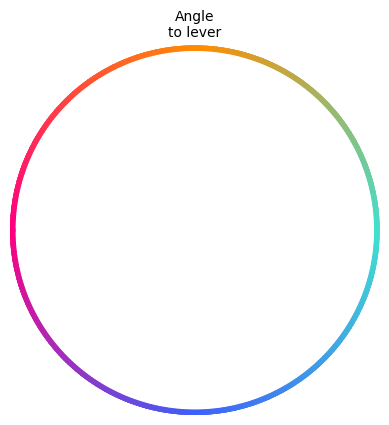

In [16]:
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
plot_color_ring(ax)

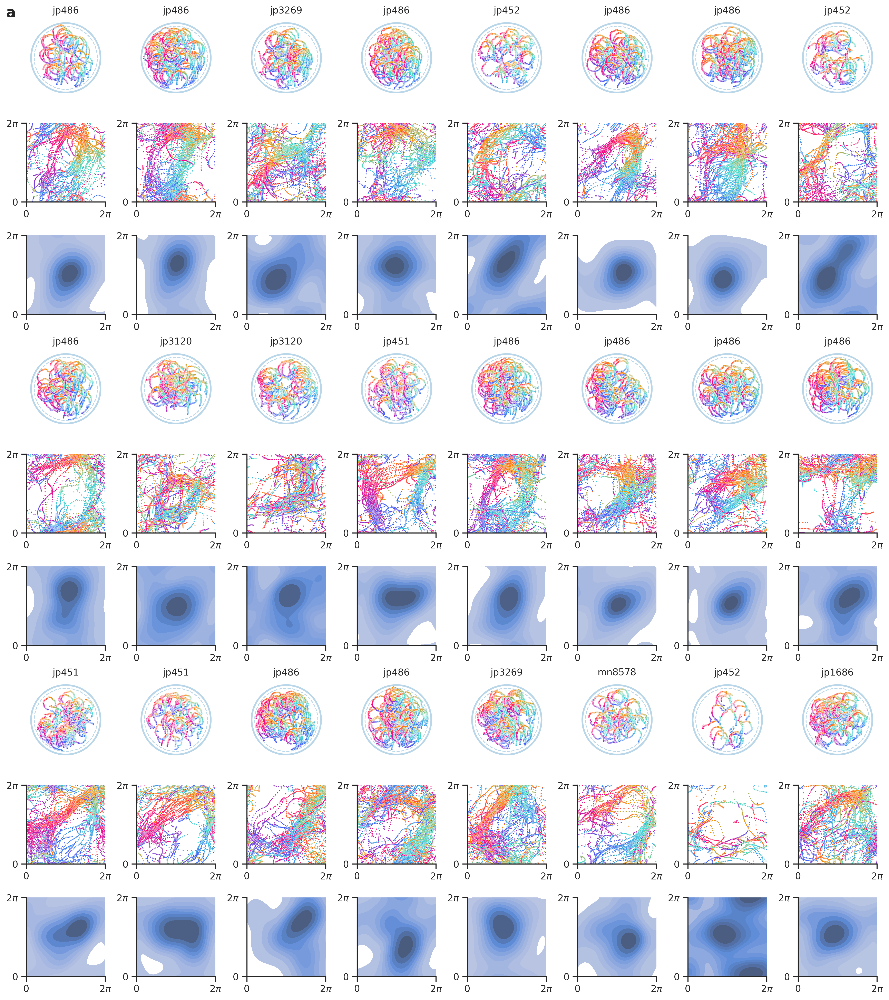

In [17]:
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
nrows_main = 9  # Total rows in the main GridSpec
ncols_main = 8  # Total columns in the main GridSpec
colSize = 1.8
rowSize = 1.8

# Set Seaborn aesthetics
sns.set(rc={"figure.dpi": 300, 'savefig.dpi': 300})
sns.set_theme(style='ticks')

def add_text(ax, x, y, label, fw="normal"):
    ax.text(
        x,
        y,
        label,
        style="normal",
        fontweight=fw,
        fontsize=GLOBALFONTSIZE + 6,
        verticalalignment="center",
        horizontalalignment="center",
        transform=ax.transAxes,
    )

# Create the main figure with the specified size
fig = plt.figure(figsize=(ncols_main * colSize, nrows_main * rowSize), constrained_layout=True)
main_gs = GridSpec(nrows_main, ncols_main, figure=fig, wspace=0.4, hspace=0.6)


# Iterate over each (session, shift) pair
for i, (s, shift) in enumerate(zip(useAble, x_y_shift_list)):
    col = i % ncols_main  # Determine the column index
    row_start = (i // ncols_main) * 3  # Determine the starting row for the sub-GridSpec
    
    mouseName = s.split('-')[0]

    # Check if there's enough space in the main GridSpec
    if row_start + 3 > nrows_main:
        print(f"Skipping session '{s}' as it exceeds the GridSpec layout.")
        continue

    # Create a sub-GridSpec for the current column
    sub_gs = main_gs[row_start:row_start + 3, col]
    gs1 = sub_gs.subgridspec(3, 1)

    # Extract shift values
    x_shift, y_shift = shift

    # Prepare the DataFrame for plotting
    plotDf = full_all_sessions[full_all_sessions.session == s].copy()
    minSpeed = 10
    plotDf = plotDf[(plotDf.speed > minSpeed)].copy()
    
    plotDf = plotDf.dropna(subset=['xPose']).copy()

    c = 'atLever_dark'

    ax0 = fig.add_subplot(gs1[0, 0])
    plot_leverPath(
        ax0, plotDf, c,
        color_map_hue='leverAngle',
        simple=True,
        title=f'{mouseName}'
    )
    ax0.tick_params(axis='both', which='both', labelsize=GLOBALFONTSIZE)

    ax1 = fig.add_subplot(gs1[1, 0])
    plot_example_full_gridCoord(
        ax1, plotDf, c,
        predicted=True,
        double=True,
        color_map_hue='leverAngle',
        simple=True,
        customTicks=True,
        x_shift=x_shift,
        y_shift=y_shift,
        ylabel='',
        omitXTicks=False,
        omitYticks=False
    )
    ax1.tick_params(axis='both', which='both', labelsize=GLOBALFONTSIZE)

    ax2 = fig.add_subplot(gs1[2, 0])
    plot_lever_full_gridCoord(
        ax2, plotDf, c,
        predicted=True,
        double=True,
        simple=True,
        customTicks=True,
        x_shift=x_shift,
        y_shift=y_shift,
        omitYticks=False
    )
    
    ax2.tick_params(axis='both', which='both', labelsize=GLOBALFONTSIZE)
    
gsT = GridSpecFromSubplotSpec(1, 1, subplot_spec=main_gs[:,:])
#***********************************#
ax0 = fig.add_subplot(gsT[:,:])

#Add figure legend
add_text(ax0,0,1,'a',fw='900')

ax0.axis('off')
###

plt.savefig('../../Output/Sup_Figure5.pdf', bbox_inches='tight', dpi=300)